In [1]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))


True
NVIDIA GeForce RTX 3050 Laptop GPU


In [3]:
import zipfile
import os

# 1. Path file ZIP asal
zip_path = r'C:\Users\alyss\datasetresize\datasetresize.zip'

# 2. Folder tujuan (Tetap di dalam datasetcleaning)
extract_path = r'C:\Users\alyss\datasetresize\datasetresized'

# 3. Buat folder tujuan jika belum ada
if not os.path.exists(extract_path):
    os.makedirs(extract_path)
    print(f"Folder baru dibuat: {extract_path}")

# 4. Proses Ekstrak
try:
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
        print(f"✅ Berhasil! File diekstrak ke dalam folder: {extract_path}")
        
    # Verifikasi isi folder
    isi_folder = os.listdir(extract_path)
    print(f"Jumlah item di dalam folder: {len(isi_folder)}")
    print("Contoh isi folder:", isi_folder[:5]) # Menampilkan 5 file pertama

except FileNotFoundError:
    print("❌ Error: File ZIP tidak ditemukan. Cek kembali penulisan nama file-nya.")
except Exception as e:
    print(f"❌ Terjadi kesalahan: {e}")

Folder baru dibuat: C:\Users\alyss\datasetresize\datasetresized
✅ Berhasil! File diekstrak ke dalam folder: C:\Users\alyss\datasetresize\datasetresized
Jumlah item di dalam folder: 1
Contoh isi folder: ['dataset_resizendenoising']


In [12]:
import yaml

# Gunakan path lengkap sesuai yang ada di alamat folder Windows kamu
path_yaml = r'C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml'

try:
    with open(path_yaml, 'r') as file:
        data = yaml.safe_load(file)
    
    print("--- Isi File DATASETRESIZE.yamll ---")
    print(f"Jumlah kelas (nc): {data.get('nc')}")
    print(f"Daftar kelas: {data.get('names')}")
except FileNotFoundError:
    print("Masih tidak ketemu. Coba cek lagi apakah nama foldernya 'datasetsize' atau 'datasetresize'.")

--- Isi File DATASETRESIZE.yamll ---
Jumlah kelas (nc): 6
Daftar kelas: ['Bacterial_Spot', 'Blossom_end_rot', 'Cracking', 'Healthy', 'Spotted_wilt_Virus', 'Sunscald']


In [13]:
from ultralytics import YOLO

# Buat model YOLO
model = YOLO('yolo11s.pt')

# Lihat semua augmentasi default yang aktif saat training
print(model.args)  # Menampilkan seluruh argumen termasuk augmentasi

{'task': 'detect', 'data': '/usr/src/ultralytics/ultralytics/cfg/datasets/coco.yaml', 'imgsz': 640, 'single_cls': False, 'model': 'yolo11s.pt'}


In [1]:
from ultralytics import YOLO

# 1️⃣ Load YOLOv11s dari path lokal
model = YOLO(r"C:\Users\alyss\YOLO\yolo11s.pt")  # gunakan raw string r"" agar backslash aman

# 2️⃣ Train model
model.train(
    data=r"C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml",  # dataset train + val
    epochs=100,
    imgsz=640,
    batch=16,
    device=0,       # GPU index
    workers=4,
    amp=True,       # mixed precision training
    cache=True, # bisa ganti 'disk' kalau RAM terbatas
    optimizer='AdamW',
    lr0=0.001,
    lrf=0.01,
    save_period=5,
    verbose=False
)

New https://pypi.org/project/ultralytics/8.3.246 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.204  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=C:\Users\alyss\YOLO\yolo11s.pt, momentum=0.937, mosaic=1.0, 

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001A63080BBB0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
 

In [2]:
import pandas as pd

# Path ke file CSV hasil training kamu
path_csv = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\results.csv'

# Baca data
df = pd.read_csv(path_csv)
df.columns = df.columns.str.strip() # Bersihin spasi di nama kolom

# Ambil baris dengan mAP50 tertinggi (biasanya ini yang dianggap model terbaik)
best_epoch = df.loc[df['metrics/mAP50(B)'].idxmax()]

print("========== RINGKASAN PERFORMA TERBAIK (BEST EPOCH) ==========")
print(f"Terjadi pada Epoch  : {int(best_epoch['epoch'])}")
print(f"Validation Loss     : {best_epoch['val/box_loss']:.4f} (Box), {best_epoch['val/cls_loss']:.4f} (Class)")
print(f"Precision           : {best_epoch['metrics/precision(B)']:.4f}")
print(f"Recall              : {best_epoch['metrics/recall(B)']:.4f}")
print(f"mAP50               : {best_epoch['metrics/mAP50(B)']:.4f}")
print(f"mAP50-95            : {best_epoch['metrics/mAP50-95(B)']:.4f}")
print("=============================================================")

========== RINGKASAN PERFORMA TERBAIK (BEST EPOCH) ==========
Terjadi pada Epoch  : 100
Validation Loss     : 0.6054 (Box), 1.2887 (Class)
Precision           : 0.9201
Recall              : 0.9143
mAP50               : 0.9330
mAP50-95            : 0.7889


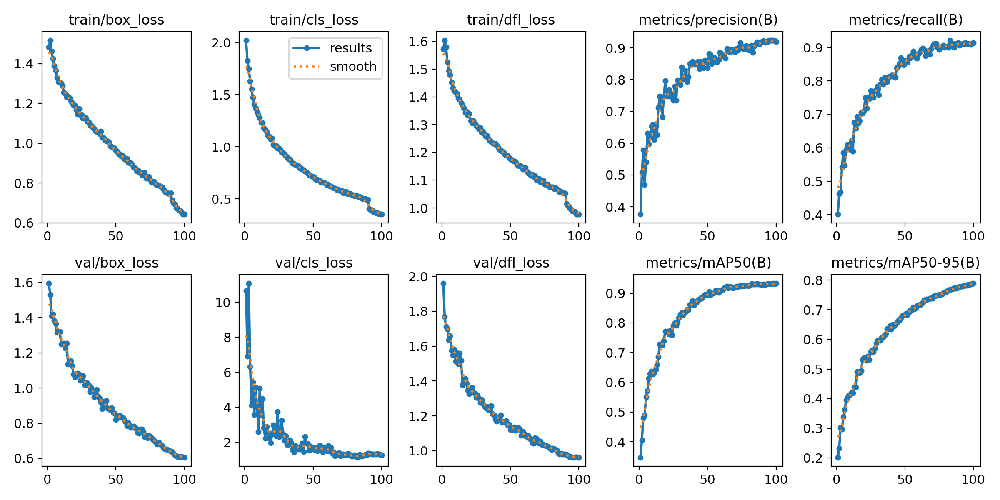

In [3]:
from IPython.display import Image, display

# Path ke file results.png di folder train27
path_hasil = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\results.png'

display(Image(filename=path_hasil))

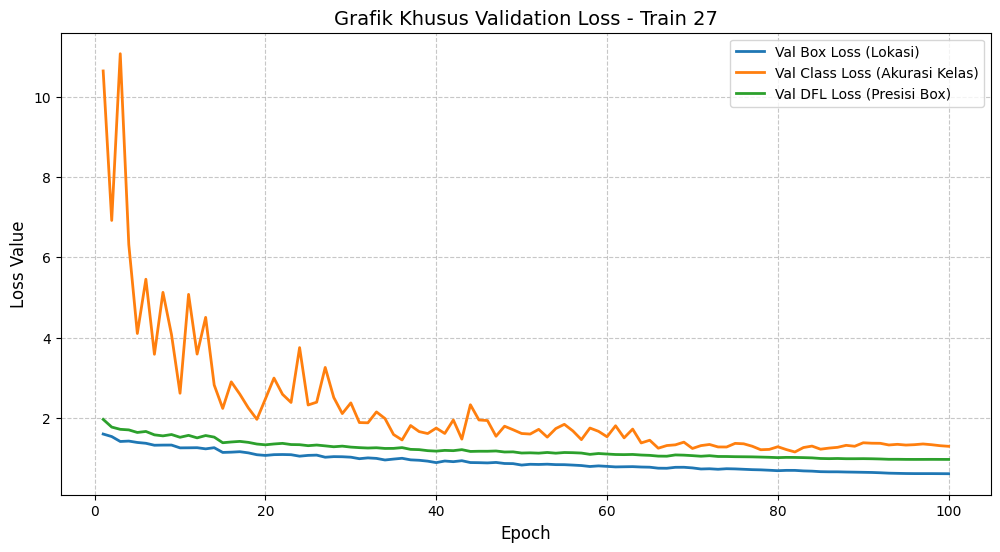

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Tambahkan ini supaya gambar otomatis muncul di bawah cell
%matplotlib inline

path_csv = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\results.csv'
df = pd.read_csv(path_csv)
df.columns = df.columns.str.strip() # Bersihkan nama kolom

# Setup area gambar
plt.figure(figsize=(12, 6))

# Plot semua jenis Validation Loss
plt.plot(df['epoch'], df['val/box_loss'], label='Val Box Loss (Lokasi)', linewidth=2)
plt.plot(df['epoch'], df['val/cls_loss'], label='Val Class Loss (Akurasi Kelas)', linewidth=2)
plt.plot(df['epoch'], df['val/dfl_loss'], label='Val DFL Loss (Presisi Box)', linewidth=2)

# Variasi tampilan
plt.title('Grafik Khusus Validation Loss - Train 27', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss Value', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# PERINTAH WAJIB supaya gambar muncul:
plt.show()

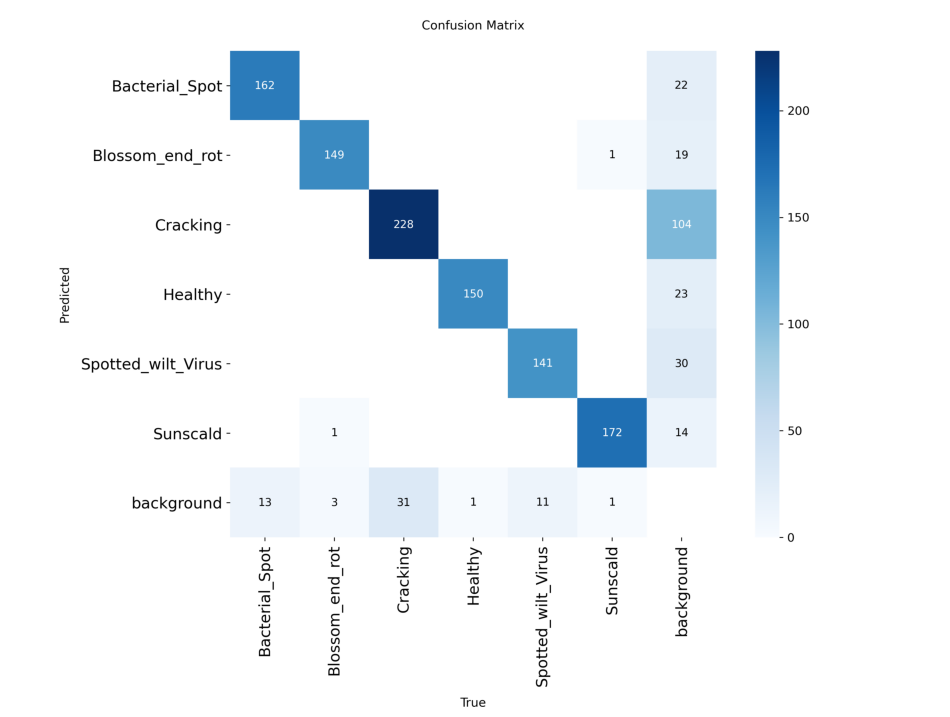

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Path folder hasil training kamu
path_folder = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36'
path_cm = f'{path_folder}\\confusion_matrix.png'

plt.figure(figsize=(12, 12)) # Ukuran diperbesar biar kebaca tulisannya
img = mpimg.imread(path_cm)
plt.imshow(img)
plt.axis('off')

# WAJIB: Supaya gak muncul tulisan <Figure size...> doang
plt.show()

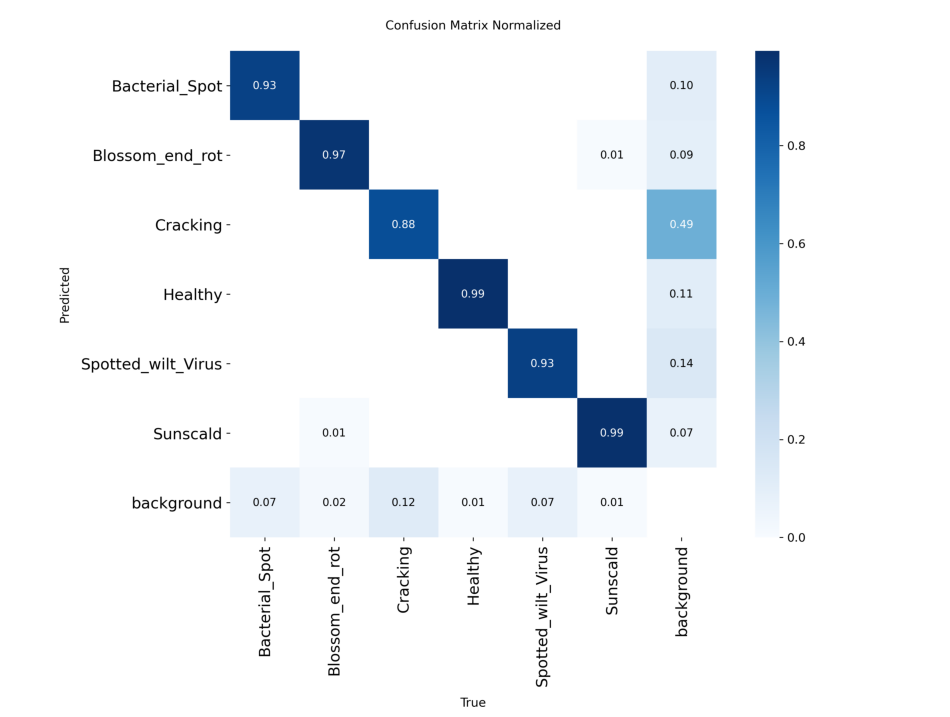

In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Path folder hasil training kamu
path_folder = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36'
path_cm = f'{path_folder}\\confusion_matrix_normalized.png'

plt.figure(figsize=(12, 12)) # Ukuran diperbesar biar kebaca tulisannya
img = mpimg.imread(path_cm)
plt.imshow(img)
plt.axis('off')

# WAJIB: Supaya gak muncul tulisan <Figure size...> doang
plt.show()

In [7]:
from ultralytics import YOLO

# 1. MUAT MODEL TERBAIK ANDA
model = YOLO(r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt')

# 2. JALANKAN VALIDASI PADA DATASET ANDA
print("Mengevaluasi model pada set validasi...")
results = model.val(
    data=r"C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml",
    split='val',
    device=0
)

# 3. AKSES DAN TAMPILKAN METRIK
print("\n--- METRIK KINERJA MODEL ---")

# INI ADALAH PERBAIKANNYA:
# Hapus '.metrics' dari 'results.metrics.box'
metrics = results.box

# Mengambil metrik spesifik
map50_95 = metrics.map      # mAP50-95
map50 = metrics.map50       # mAP50
precision = metrics.p[0]    # Precision untuk 'all' class
recall = metrics.r[0]       # Recall untuk 'all' class

# Menampilkan metrik utama
print(f"mAP50-95: {map50_95:.4f}")
print(f"   mAP50: {map50:.4f}")
print(f"Precision: {precision:.4f}")
print(f"   Recall: {recall:.4f}")

Mengevaluasi model pada set validasi...
Ultralytics 8.3.204  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access  (ping: 0.30.1 ms, read: 12.85.4 MB/s, size: 39.1 KB)
val: Scanning C:\Users\alyss\DATASETRESIZE\datasetresized\dataset_resizendenoising\valid\labels.cache... 809 images, 241 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 835/835 398.8Kit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 139, len(boxes) = 1064. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 53/53 2.8it/s 19.0s0.3s
                   all        835       1064       0.92      0.914      0.933      0.788
        Bacter

In [8]:
from ultralytics import YOLO

# 1. MUAT MODEL TERBAIK ANDA
model = YOLO(r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt')

# 2. DAPATKAN PARAMETER & FLOPS
print("Mengambil info model (Parameter & FLOPs)...")

# --- INI PERBAIKANNYA ---
# Hapus 'verbose=False' agar fungsi ini mengembalikan tuple
info = model.info() 
# -------------------------

# Sekarang 'info' akan berisi tuple, bukan None
layers = info[0]
parameters = info[1]
flops = info[3]  # Ini adalah GFLOPs

# 3. DAPATKAN WAKTU INFERENCE
print("\nMengukur waktu inference rata-rata (mohon tunggu)...")
results = model.val(
    data=r"C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml",
    split='val',
    device=0,
    verbose=False  # verbose=False di sini TIDAK apa-apa
)

# Ambil waktu inference (dalam milidetik) dari hasil validasi
inference_time_ms = results.speed['inference']

# 4. TAMPILKAN SEMUA METRIK EFISIENSI
print("\n--- 📊 Metrik Efisiensi Model ---")
print(f" 1. Jumlah Layer: {layers}")
print(f" 2. Jumlah Parameter: {parameters:,}") # Diberi format koma
print(f" 3. FLOPs: {flops} GFLOPs")
print(f" 4. Waktu Inference: {inference_time_ms:.2f} ms per gambar")

Mengambil info model (Parameter & FLOPs)...
YOLO11s summary: 181 layers, 9,430,114 parameters, 0 gradients, 21.6 GFLOPs

Mengukur waktu inference rata-rata (mohon tunggu)...
Ultralytics 8.3.204  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access  (ping: 0.20.0 ms, read: 89.225.5 MB/s, size: 35.7 KB)
val: Scanning C:\Users\alyss\DATASETRESIZE\datasetresized\dataset_resizendenoising\valid\labels.cache... 809 images, 241 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 835/835 523.8Kit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 139, len(boxes) = 1064. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━

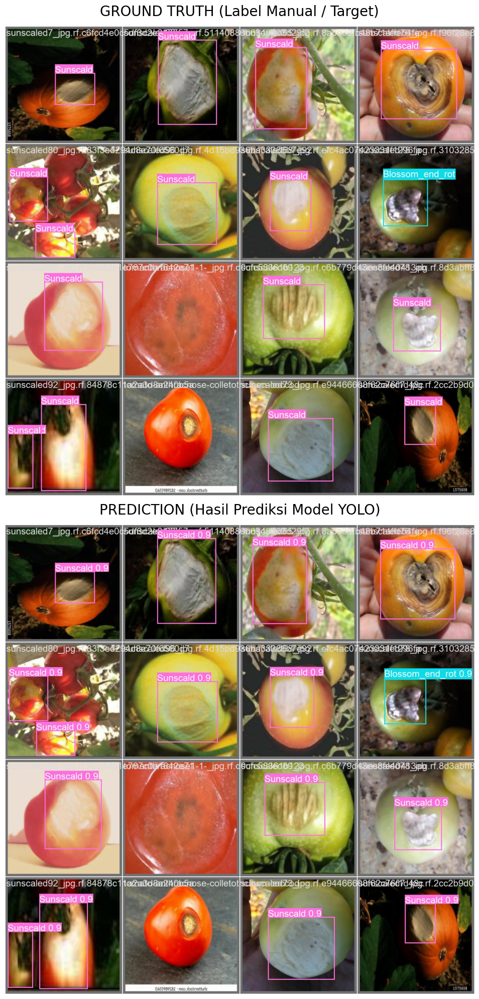

In [9]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Path ke folder hasil training Anda
path_folder = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36'

# Setup Plot
fig, axes = plt.subplots(2, 1, figsize=(20, 20))

# 1. Menampilkan Ground Truth (Label Asli)
img_gt = mpimg.imread(os.path.join(path_folder, 'val_batch0_labels.jpg'))
axes[0].imshow(img_gt)
axes[0].set_title("GROUND TRUTH (Label Manual / Target)", fontsize=20, pad=15)
axes[0].axis('off')

# 2. Menampilkan Prediction (Hasil Deteksi Model)
img_pred = mpimg.imread(os.path.join(path_folder, 'val_batch0_pred.jpg'))
axes[1].imshow(img_pred)
axes[1].set_title("PREDICTION (Hasil Prediksi Model YOLO)", fontsize=20, pad=15)
axes[1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
#TRAINING

In [1]:
from ultralytics import YOLO

# 1. Load model terbaik
model = YOLO(r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt')

# 2. Jalankan evaluasi pada split 'train'
metrics_train = model.val(data=r'C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml', split='train', plots=False)

# 3. Ambil data dengan aman (pakai .get untuk cegah KeyError)
d_train = metrics_train.results_dict
box_loss = d_train.get('val/box_loss', d_train.get('box_loss', 0))
cls_loss = d_train.get('val/cls_loss', d_train.get('cls_loss', 0))

print("========== RINGKASAN PERFORMA (DATA TRAINING) ==========")
print(f"Status              : Evaluasi Akhir pada Dataset Training")
print(f"Training Loss       : {box_loss:.4f} (Box), {cls_loss:.4f} (Class)")
print(f"Precision           : {d_train.get('metrics/precision(B)', 0):.4f}")
print(f"Recall              : {d_train.get('metrics/recall(B)', 0):.4f}")
print(f"mAP50               : {d_train.get('metrics/mAP50(B)', 0):.4f}")
print(f"mAP50-95            : {d_train.get('metrics/mAP50-95(B)', 0):.4f}")
print("========================================================")

Ultralytics 8.3.248  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access  (ping: 0.20.0 ms, read: 95.118.4 MB/s, size: 35.3 KB)
val: Scanning C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\train\labels.cache... 6736 images, 650 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 6736/6736 2.2Mit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 986, len(boxes) = 12594. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 421/421 6.7s/it 46:51<7.4ss
                   all       6736      12594      0.973      0.968      0.986      0.881
        Bacterial_Spot       1350       5181   

In [2]:
from ultralytics import YOLO
import torch

# 1. Load Model
model_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt'
model = YOLO(model_path)

# 2. Ambil Info Arsitektur Secara Manual (Agar tidak Error NoneType)
# Menghitung parameter dan layer langsung dari objek model
layers = len(list(model.model.modules()))
params = sum(p.numel() for p in model.model.parameters())
# FLOPs biasanya dihitung saat awal load/info, kita ambil dari atribut internal jika tersedia
flops = getattr(model.model, 'flops', 0) 

# 3. Jalankan Evaluasi pada data TRAINING
print("Menghitung kecepatan inference pada data TRAINING...")
results_train = model.val(data=r'C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml', 
                          split='train', batch=1, plots=False)

# Ambil waktu inference
waktu_inf_train = results_train.speed.get('inference', 0)

print("\n--- 📊 Metrik Efisiensi Model (TAHAP TRAINING) ---")
print(f" 1. Jumlah Layer: {layers}")
print(f" 2. Jumlah Parameter: {params:,}".replace(',', '.'))
print(f" 3. FLOPs: {flops:.7f} GFLOPs")
print(f" 4. Waktu Inference: {waktu_inf_train:.2f} ms per gambar")
print("--------------------------------------------------")

Menghitung kecepatan inference pada data TRAINING...
Ultralytics 8.3.248  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access  (ping: 0.30.1 ms, read: 57.618.1 MB/s, size: 54.7 KB)
val: Scanning C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\train\labels.cache... 6736 images, 650 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 6736/6736 3.3Mit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 986, len(boxes) = 12594. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6736/6736 9.9it/s 11:21<0.2ss
                   all       6736      12594      0.973      0.968      0.986    

In [3]:
from ultralytics import YOLO

# 1. Load Model
model_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt'
model = YOLO(model_path)

# 2. Jalankan Evaluasi pada data TRAINING
# batch=1 digunakan untuk mendapatkan waktu per gambar yang paling akurat
results_train = model.val(data=r'C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml', 
                          split='train', batch=1, plots=False)

# 3. Hitung Metrik Kecepatan
speed = results_train.speed
t_inf = speed.get('inference', 0)
t_pre = speed.get('preprocess', 0)
t_post = speed.get('postprocess', 0)

total_waktu = t_pre + t_inf + t_post
fps = 1000 / total_waktu if total_waktu > 0 else 0

print("\n--- 📊 Metrik Efisiensi Model (TAHAP TRAINING) ---")
print(f"Kecepatan Inference : {t_inf:.2f} ms/image")
print(f"Total Waktu per Foto: {total_waktu:.2f} ms")
print(f"FPS                 : {fps:.2f}")
print("--------------------------------------------------")

Ultralytics 8.3.248  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access  (ping: 0.20.1 ms, read: 73.932.7 MB/s, size: 32.7 KB)
val: Scanning C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\train\labels.cache... 6736 images, 650 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 6736/6736 3.4Mit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 986, len(boxes) = 12594. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6736/6736 10.0it/s 11:14<0.1s
                   all       6736      12594      0.973      0.968      0.986      0.882
        Bacterial_Spot       1350       5181 

In [ ]:
#TESTING

In [4]:
# 1. Jalankan evaluasi pada split 'test'
metrics_test = model.val(data=r'C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml', split='test', plots=False)

# 2. Ambil data dengan aman
d_test = metrics_test.results_dict
box_loss_t = d_test.get('val/box_loss', d_test.get('box_loss', 0))
cls_loss_t = d_test.get('val/cls_loss', d_test.get('cls_loss', 0))

print("\n========== RINGKASAN PERFORMA (DATA TESTING) ==========")
print(f"Status              : Evaluasi Akhir pada Dataset Testing")
print(f"Testing Loss        : {box_loss_t:.4f} (Box), {cls_loss_t:.4f} (Class)")
print(f"Precision           : {d_test.get('metrics/precision(B)', 0):.4f}")
print(f"Recall              : {d_test.get('metrics/recall(B)', 0):.4f}")
print(f"mAP50               : {d_test.get('metrics/mAP50(B)', 0):.4f}")
print(f"mAP50-95            : {d_test.get('metrics/mAP50-95(B)', 0):.4f}")
print("========================================================")

Ultralytics 8.3.248  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
val: Fast image access  (ping: 0.30.1 ms, read: 38.310.6 MB/s, size: 36.9 KB)
val: Scanning C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\test\labels.cache... 819 images, 221 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 837/837 279.0Kit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 133, len(boxes) = 1101. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 53/53 7.2s/it 6:217.0ss
                   all        837       1101      0.892       0.92      0.925      0.772
        Bacterial_Spot         58        203      0.951      0.862      0.926      0.645
       Blossom_end_rot        128        184     

In [5]:
from ultralytics import YOLO

# 1. Load Model
model = YOLO(r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt')

# 2. Ambil Info Arsitektur (Tetap sama karena modelnya sama)
layers = len(list(model.model.modules()))
params = sum(p.numel() for p in model.model.parameters())
flops = getattr(model.model, 'flops', 0)

# 3. Jalankan Evaluasi pada data TESTING
print("Menghitung kecepatan inference pada data TESTING...")
results_test = model.val(data=r'C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml', 
                         split='test', batch=1, plots=False)

# Ambil waktu inference
waktu_inf_test = results_test.speed.get('inference', 0)

print("\n--- 📊 Metrik Efisiensi Model (TAHAP TESTING) ---")
print(f" 1. Jumlah Layer: {layers}")
print(f" 2. Jumlah Parameter: {params:,}".replace(',', '.'))
print(f" 3. FLOPs: {flops:.7f} GFLOPs")
print(f" 4. Waktu Inference: {waktu_inf_test:.2f} ms per gambar")
print("-------------------------------------------------")

Menghitung kecepatan inference pada data TESTING...
Ultralytics 8.3.248  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access  (ping: 0.20.1 ms, read: 140.334.9 MB/s, size: 46.3 KB)
val: Scanning C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\test\labels.cache... 819 images, 221 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 837/837 279.9Kit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 133, len(boxes) = 1101. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 837/837 10.1it/s 1:23<0.1ss
                   all        837       1101      0.892       0.92      0.925      0.7

In [6]:
from ultralytics import YOLO

# 1. Load Model
model = YOLO(r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt')

# 2. Jalankan Evaluasi pada data TESTING
results_test = model.val(data=r'C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml', 
                         split='test', batch=1, plots=False)

# 3. Hitung Metrik Kecepatan
speed_t = results_test.speed
t_inf_t = speed_t.get('inference', 0)
t_pre_t = speed_t.get('preprocess', 0)
t_post_t = speed_t.get('postprocess', 0)

total_waktu_t = t_pre_t + t_inf_t + t_post_t
fps_t = 1000 / total_waktu_t if total_waktu_t > 0 else 0

print("\n--- 📊 Metrik Efisiensi Model (TAHAP TESTING) ---")
print(f"Kecepatan Inference : {t_inf_t:.2f} ms/image")
print(f"Total Waktu per Foto: {total_waktu_t:.2f} ms")
print(f"FPS                 : {fps_t:.2f}")
print("-------------------------------------------------")

Ultralytics 8.3.248  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access  (ping: 0.20.1 ms, read: 78.424.6 MB/s, size: 37.4 KB)
val: Scanning C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\test\labels.cache... 819 images, 221 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 837/837 419.2Kit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 133, len(boxes) = 1101. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 837/837 10.1it/s 1:23<0.1ss
                   all        837       1101      0.892       0.92      0.925      0.772
        Bacterial_Spot         58        203      

In [7]:
from ultralytics import YOLO
import os

# 1. Tentukan path ke model hasil training terbaik Anda
# Berdasarkan notebook Anda, path-nya adalah:
path_model = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt'

# 2. Load model (Langkah ini untuk mengatasi NameError)
model = YOLO(path_model)

# 3. Jalankan validasi untuk mendapatkan metrik detail
metrics = model.val()

# --- A. Menampilkan FPS (Efisiensi) ---
# Mengambil data kecepatan (dalam milidetik per gambar)
preprocess_time = metrics.speed['preprocess']
inference_time = metrics.speed['inference']
postprocess_time = metrics.speed['postprocess']

# Menghitung Total Waktu per gambar
total_time_ms = preprocess_time + inference_time + postprocess_time

# Menghitung FPS (1000ms / total_time_ms)
fps = 1000 / total_time_ms

print(f"\n--- Metrik Efisiensi Model ---")
print(f"Kecepatan Inference : {inference_time:.2f} ms/image")
print(f"Total Waktu per Foto: {total_time_ms:.2f} ms")
print(f"FPS                 : {fps:.2f}")

# --- B. Menampilkan IoU (mAP) ---
# mAP50 adalah akurasi pada ambang batas IoU 0.50
# mAP50-95 adalah rata-rata akurasi pada rentang IoU 0.50 sampai 0.95
iou_50 = metrics.results_dict['metrics/mAP50(B)']
iou_50_95 = metrics.results_dict['metrics/mAP50-95(B)']

print(f"\n--- Metrik IoU (mAP) ---")
print(f"mAP (IoU=0.50)      : {iou_50:.4f}")
print(f"mAP (IoU=0.50-0.95) : {iou_50_95:.4f}")

Ultralytics 8.3.248  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access  (ping: 0.40.2 ms, read: 38.617.0 MB/s, size: 43.7 KB)
val: Scanning C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\valid\labels.cache... 809 images, 241 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 835/835 418.5Kit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 139, len(boxes) = 1064. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 53/53 7.3s/it 6:287.3ss
                   all        835       1064       0.92      0.914      0.933      0.788
        Bacterial_Spot         46        175      0.9

--- Memulai Pencarian 6 Kelas di 6736 Gambar Training ---
[23] ✅ BERHASIL TEMUKAN: Bacterial_Spot
Sedang memeriksa gambar ke-100...
Sedang memeriksa gambar ke-200...
Sedang memeriksa gambar ke-300...
[386] ✅ BERHASIL TEMUKAN: Cracking
Sedang memeriksa gambar ke-400...
Sedang memeriksa gambar ke-500...
Sedang memeriksa gambar ke-600...
Sedang memeriksa gambar ke-700...
[709] ✅ BERHASIL TEMUKAN: Blossom_end_rot
Sedang memeriksa gambar ke-800...
Sedang memeriksa gambar ke-900...
[998] ✅ BERHASIL TEMUKAN: Sunscald
Sedang memeriksa gambar ke-1000...
Sedang memeriksa gambar ke-1100...
Sedang memeriksa gambar ke-1200...
Sedang memeriksa gambar ke-1300...
Sedang memeriksa gambar ke-1400...
[1447] ✅ BERHASIL TEMUKAN: Spotted_wilt_Virus
[1462] ✅ BERHASIL TEMUKAN: Healthy

✨ SEMUA 6 KELAS SUDAH DITEMUKAN!


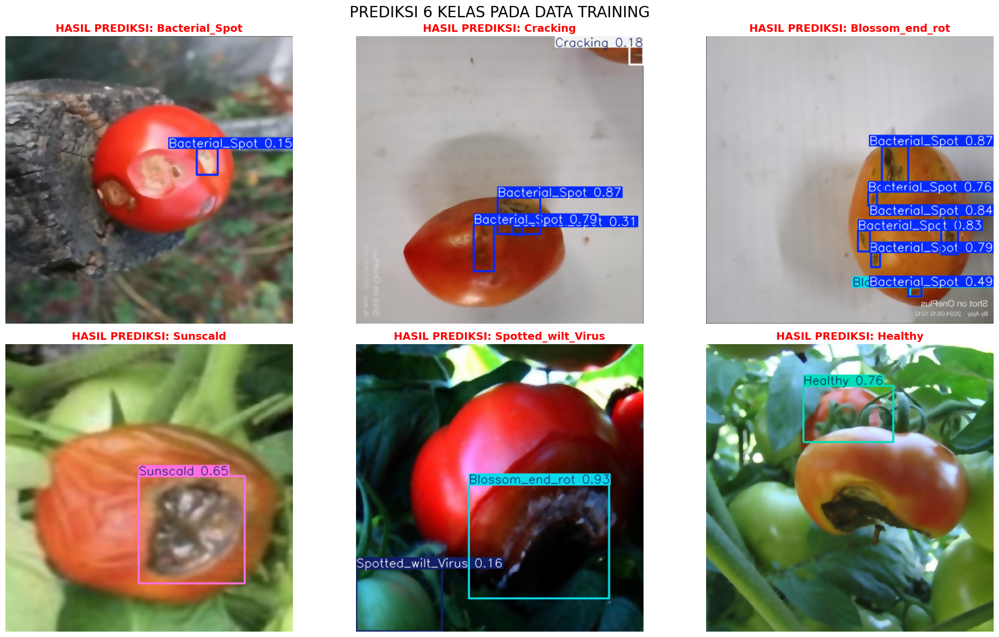

In [1]:
import matplotlib.pyplot as plt
from ultralytics import YOLO
import os
import glob

# 1. Load Model (Pastikan path ini benar)
model_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt'
model = YOLO(model_path)

# 2. Path ke folder TRAINING
train_images_path = r'C:\Users\alyss\DATASETRESIZE\datasetresized\dataset_resizendenoising\train\images'
image_files = glob.glob(os.path.join(train_images_path, "*.jpg"))

target_classes = model.names # Ada 6 kelas
found_samples = {}

print(f"--- Memulai Pencarian 6 Kelas di {len(image_files)} Gambar Training ---")

# 3. Loop Pencarian yang Lebih Cepat
count = 0
for img_path in image_files:
    count += 1
    # Prediksi dengan conf=0.1 (agar lebih sensitif)
    results = model.predict(source=img_path, conf=0.1, verbose=False)
    
    for r in results:
        if len(r.boxes) > 0: # Jika ada objek terdeteksi
            for box in r.boxes:
                class_id = int(box.cls)
                class_name = target_classes[class_id]
                
                # Simpan jika belum ada di koleksi
                if class_name not in found_samples:
                    found_samples[class_name] = r.plot()
                    print(f"[{count}] ✅ BERHASIL TEMUKAN: {class_name}")

    # Berhenti jika sudah lengkap 6 kelas
    if len(found_samples) == len(target_classes):
        print("\n✨ SEMUA 6 KELAS SUDAH DITEMUKAN!")
        break
    
    # Progress update setiap 100 gambar agar anda tidak bingung
    if count % 100 == 0:
        print(f"Sedang memeriksa gambar ke-{count}...")

# 4. Tampilkan dalam Grid 2x3
if found_samples:
    plt.figure(figsize=(20, 12))
    for i, (name, img_bgr) in enumerate(found_samples.items()):
        img_rgb = img_bgr[:, :, ::-1]
        plt.subplot(2, 3, i + 1)
        plt.imshow(img_rgb)
        plt.title(f"HASIL PREDIKSI: {name}", fontsize=14, fontweight='bold', color='red')
        plt.axis('off')

    plt.suptitle("PREDIKSI 6 KELAS PADA DATA TRAINING", fontsize=20)
    plt.tight_layout()
    plt.show()
else:
    print("Tidak ada kelas yang ditemukan. Cek kembali path folder gambar Anda.")

--- Memulai Pencarian 6 Kelas Berbeda di 594 Gambar ---
[1] ✅ BERHASIL TEMUKAN: Blossom_end_rot (dari gambar baru)
[58] ✅ BERHASIL TEMUKAN: Sunscald (dari gambar baru)
[61] ✅ BERHASIL TEMUKAN: Healthy (dari gambar baru)
[66] ✅ BERHASIL TEMUKAN: Cracking (dari gambar baru)
Sedang memeriksa gambar ke-100...
Sedang memeriksa gambar ke-200...
[244] ✅ BERHASIL TEMUKAN: Bacterial_Spot (dari gambar baru)
Sedang memeriksa gambar ke-300...
[362] ✅ BERHASIL TEMUKAN: Spotted_wilt_Virus (dari gambar baru)

✨ SEMUA 6 KELAS SUDAH DITEMUKAN DENGAN GAMBAR BERBEDA!


<Figure size 640x480 with 0 Axes>

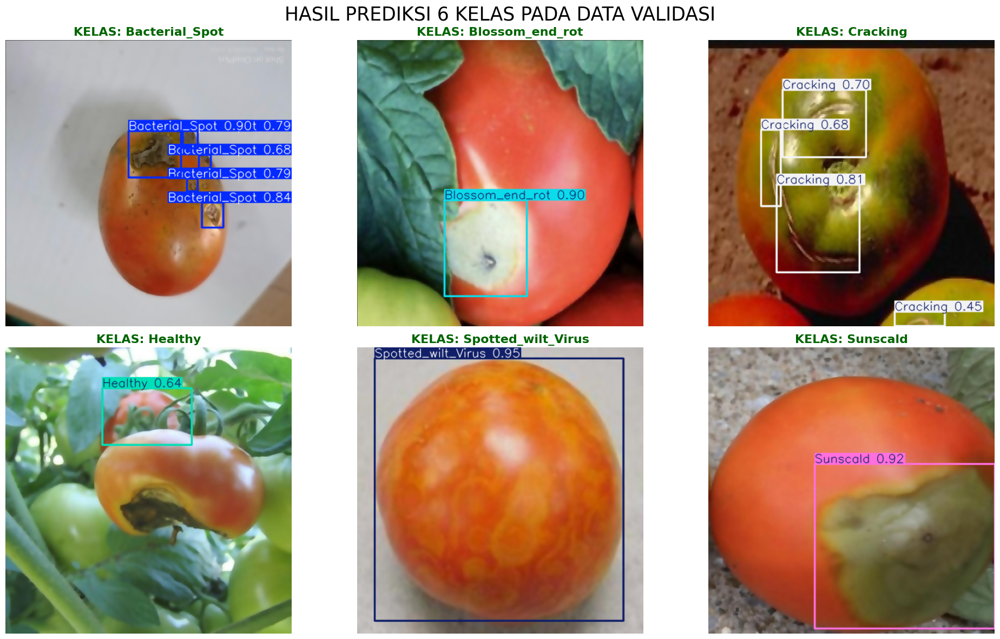

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
from ultralytics import YOLO
import os
import glob

# --- SETTING PATH (Pastikan ini sesuai folder Anda) ---
model_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt'
train_images_path = r'C:\Users\alyss\DATASETRESIZE\datasetresized\dataset_resizendenoising\valid\images'

model = YOLO(model_path)
image_files = glob.glob(os.path.join(train_images_path, "*.jpg"))
target_classes = model.names
found_samples = {}
used_image_paths = set() # Untuk mencatat gambar yang sudah dipakai

print(f"--- Memulai Pencarian 6 Kelas Berbeda di {len(image_files)} Gambar ---")

count = 0
for img_path in image_files:
    count += 1
    
    # Jika gambar ini sudah dipakai untuk kelas lain, lewati saja
    if img_path in used_image_paths:
        continue
        
    results = model.predict(source=img_path, conf=0.2, verbose=False)
    
    for r in results:
        # Cari box dalam gambar
        for box in r.boxes:
            class_id = int(box.cls)
            class_name = target_classes[class_id]
            
            # Cek jika kelas belum ditemukan DAN gambar belum pernah dipakai
            if class_name not in found_samples and img_path not in used_image_paths:
                found_samples[class_name] = r.plot()
                used_image_paths.add(img_path) # Tandai gambar ini sudah digunakan
                print(f"[{count}] ✅ BERHASIL TEMUKAN: {class_name} (dari gambar baru)")
                break # Pindah ke gambar selanjutnya setelah satu kelas diambil

    # Berhenti jika sudah lengkap 6 kelas dari 6 gambar berbeda
    if len(found_samples) == len(target_classes):
        print("\n✨ SEMUA 6 KELAS SUDAH DITEMUKAN DENGAN GAMBAR BERBEDA!")
        break
    
    if count % 100 == 0:
        print(f"Sedang memeriksa gambar ke-{count}...")

# --- PROSES MENAMPILKAN ---
if found_samples:
    plt.clf()
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.flatten()

    # Urutkan berdasarkan nama kelas agar rapi
    sorted_keys = sorted(found_samples.keys())
    
    for i, name in enumerate(sorted_keys):
        img_bgr = found_samples[name]
        img_rgb = img_bgr[:, :, ::-1] # BGR ke RGB
        axes[i].imshow(img_rgb)
        axes[i].set_title(f"KELAS: {name}", fontsize=16, fontweight='bold', color='darkgreen')
        axes[i].axis('off')

    plt.suptitle("HASIL PREDIKSI 6 KELAS PADA DATA VALIDASI", fontsize=25)
    plt.tight_layout()
    plt.show()
else:
    print("Tidak ada hasil yang ditemukan.")

--- Memulai Pencarian 6 Kelas Berbeda di 837 Gambar ---
[2] ✅ BERHASIL TEMUKAN: Spotted_wilt_Virus (dari gambar baru)
[3] ✅ BERHASIL TEMUKAN: Healthy (dari gambar baru)
[5] ✅ BERHASIL TEMUKAN: Blossom_end_rot (dari gambar baru)
[65] ✅ BERHASIL TEMUKAN: Sunscald (dari gambar baru)
Sedang memeriksa gambar ke-100...
[112] ✅ BERHASIL TEMUKAN: Bacterial_Spot (dari gambar baru)
[138] ✅ BERHASIL TEMUKAN: Cracking (dari gambar baru)

✨ SEMUA 6 KELAS SUDAH DITEMUKAN DENGAN GAMBAR BERBEDA!


<Figure size 640x480 with 0 Axes>

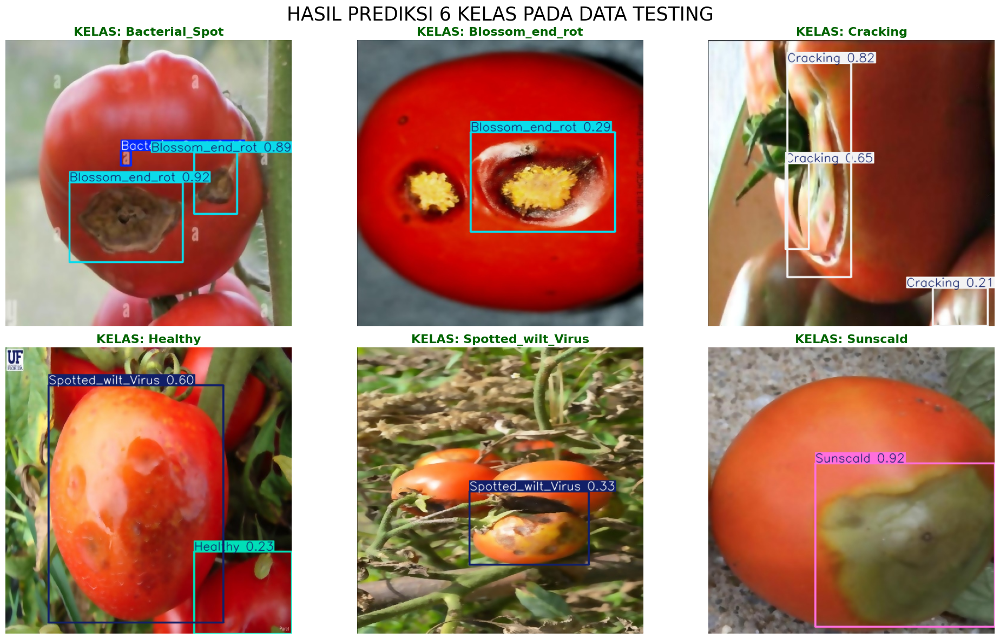

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
from ultralytics import YOLO
import os
import glob

# --- SETTING PATH (Pastikan ini sesuai folder Anda) ---
model_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt'
train_images_path = r'C:\Users\alyss\DATASETRESIZE\datasetresized\dataset_resizendenoising\test\images'

model = YOLO(model_path)
image_files = glob.glob(os.path.join(train_images_path, "*.jpg"))
target_classes = model.names
found_samples = {}
used_image_paths = set() # Untuk mencatat gambar yang sudah dipakai

print(f"--- Memulai Pencarian 6 Kelas Berbeda di {len(image_files)} Gambar ---")

count = 0
for img_path in image_files:
    count += 1
    
    # Jika gambar ini sudah dipakai untuk kelas lain, lewati saja
    if img_path in used_image_paths:
        continue
        
    results = model.predict(source=img_path, conf=0.2, verbose=False)
    
    for r in results:
        # Cari box dalam gambar
        for box in r.boxes:
            class_id = int(box.cls)
            class_name = target_classes[class_id]
            
            # Cek jika kelas belum ditemukan DAN gambar belum pernah dipakai
            if class_name not in found_samples and img_path not in used_image_paths:
                found_samples[class_name] = r.plot()
                used_image_paths.add(img_path) # Tandai gambar ini sudah digunakan
                print(f"[{count}] ✅ BERHASIL TEMUKAN: {class_name} (dari gambar baru)")
                break # Pindah ke gambar selanjutnya setelah satu kelas diambil

    # Berhenti jika sudah lengkap 6 kelas dari 6 gambar berbeda
    if len(found_samples) == len(target_classes):
        print("\n✨ SEMUA 6 KELAS SUDAH DITEMUKAN DENGAN GAMBAR BERBEDA!")
        break
    
    if count % 100 == 0:
        print(f"Sedang memeriksa gambar ke-{count}...")

# --- PROSES MENAMPILKAN ---
if found_samples:
    plt.clf()
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    axes = axes.flatten()

    # Urutkan berdasarkan nama kelas agar rapi
    sorted_keys = sorted(found_samples.keys())
    
    for i, name in enumerate(sorted_keys):
        img_bgr = found_samples[name]
        img_rgb = img_bgr[:, :, ::-1] # BGR ke RGB
        axes[i].imshow(img_rgb)
        axes[i].set_title(f"KELAS: {name}", fontsize=16, fontweight='bold', color='darkgreen')
        axes[i].axis('off')

    plt.suptitle("HASIL PREDIKSI 6 KELAS PADA DATA TESTING", fontsize=25)
    plt.tight_layout()
    plt.show()
else:
    print("Tidak ada hasil yang ditemukan.")

In [1]:
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO

# 1. PATH MODEL KAMU
model_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt'

# 2. LOAD MODEL
model = YOLO(model_path)

# 3. OTOMATIS AMBIL NAMA FOLDER (Misal: train27)
# Mengambil nama folder 2 tingkat di atas file best.pt
run_name = os.path.basename(os.path.dirname(os.path.dirname(model_path)))

splits = ['train', 'val', 'test']

print(f"🚀 Memulai Evaluasi untuk Model: {run_name}")

for s in splits:
    print(f"\n🔎 Mengevaluasi Split: {s.upper()} ...")
    
    # Jalankan Validasi
    results = model.val(
        data=r'C:\Users\alyss\DATASETRESIZE\DATASETRESIZE.yaml', 
        split=s, 
        plots=True, # WAJIB True agar YOLO bikin gambar matrix-nya
        name=f'eval_{run_name}_{s}'
    )
    
    # 4. TAMPILKAN VISUALISASI SECARA OTOMATIS
    save_dir = results.save_dir
    # Cari file yang namanya ada 'confusion_matrix' dan formatnya .png
    matrix_files = [f for f in os.listdir(save_dir) if 'confusion' in f and f.endswith('.png')]
    
    if not matrix_files:
        print(f"⚠️ Waduh, Confusion Matrix tidak ketemu di folder {save_dir}")
    else:
        for f in matrix_files:
            img_path = os.path.join(save_dir, f)
            
            # Tampilkan Gambar
            plt.figure(figsize=(12, 10))
            img = plt.imread(img_path)
            plt.imshow(img)
            
            # Judul yang kamu mau (biar tau ini hasil train berapa)
            plt.title(f"VISUALISASI {run_name.upper()} - DATA {s.upper()}\nFile: {f}", 
                      fontsize=14, fontweight='bold', color='blue')
            plt.axis('off')
            plt.show()
            
            print(f"✅ Berhasil menampilkan: {f} dari folder {run_name}")

🚀 Memulai Evaluasi untuk Model: train36

🔎 Mengevaluasi Split: TRAIN ...
Ultralytics 8.3.248  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
YOLO11s summary (fused): 100 layers, 9,415,122 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access  (ping: 0.20.1 ms, read: 89.618.1 MB/s, size: 38.0 KB)
val: Scanning C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\train\labels.cache... 6736 images, 650 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 6736/6736 3.4Mit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 986, len(boxes) = 12594. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 421/421 2.5it/s 2:50<0.4s
                   all       6736      12594      0.973      0.96

<Figure size 1200x1000 with 1 Axes>

✅ Berhasil menampilkan: confusion_matrix.png dari folder train36


<Figure size 1200x1000 with 1 Axes>

✅ Berhasil menampilkan: confusion_matrix_normalized.png dari folder train36

🔎 Mengevaluasi Split: VAL ...
Ultralytics 8.3.248  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
val: Fast image access  (ping: 0.20.0 ms, read: 45.15.7 MB/s, size: 43.1 KB)
val: Scanning C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\valid\labels.cache... 594 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 594/594 297.0Kit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 139, len(boxes) = 1064. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 38/38 2.4it/s 16.1s0.4s
                   all        594       1064      0.963      0.918      0.958      0.812
        Bacterial_Spot         46

<Figure size 1200x1000 with 1 Axes>

✅ Berhasil menampilkan: confusion_matrix.png dari folder train36


<Figure size 1200x1000 with 1 Axes>

✅ Berhasil menampilkan: confusion_matrix_normalized.png dari folder train36

🔎 Mengevaluasi Split: TEST ...
Ultralytics 8.3.248  Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
val: Fast image access  (ping: 0.20.0 ms, read: 39.511.4 MB/s, size: 28.2 KB)
val: Scanning C:\Users\alyss\datasetresize\datasetresized\dataset_resizendenoising\test\labels.cache... 819 images, 221 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 837/837 419.6Kit/s 0.0s
WARNING Box and segment counts should be equal, but got len(segments) = 133, len(boxes) = 1101. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 53/53 2.6it/s 20.0s0.3ss
                   all        837       1101      0.892       0.92      0.925      0.772
        Bacterial_Spot       

<Figure size 1200x1000 with 1 Axes>

✅ Berhasil menampilkan: confusion_matrix.png dari folder train36


<Figure size 1200x1000 with 1 Axes>

✅ Berhasil menampilkan: confusion_matrix_normalized.png dari folder train36


🔍 Mencari dan menampilkan gambar...

📂 FOLDER: EVAL_TRAIN36_TRAIN
📸 Menampilkan: confusion_matrix.png


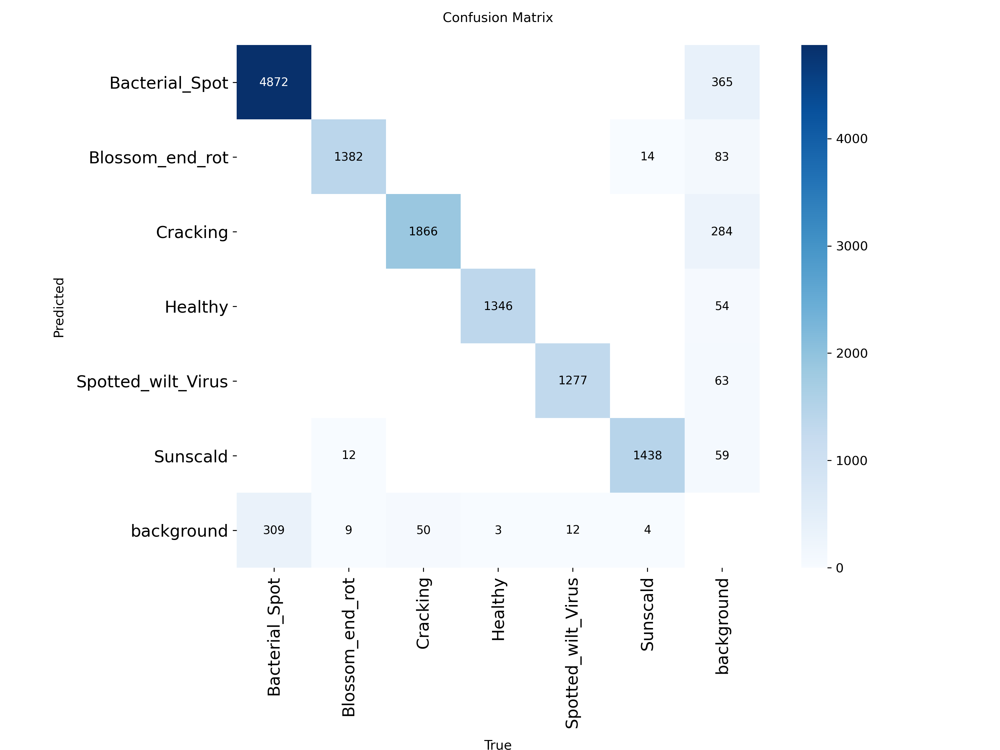

📸 Menampilkan: confusion_matrix_normalized.png


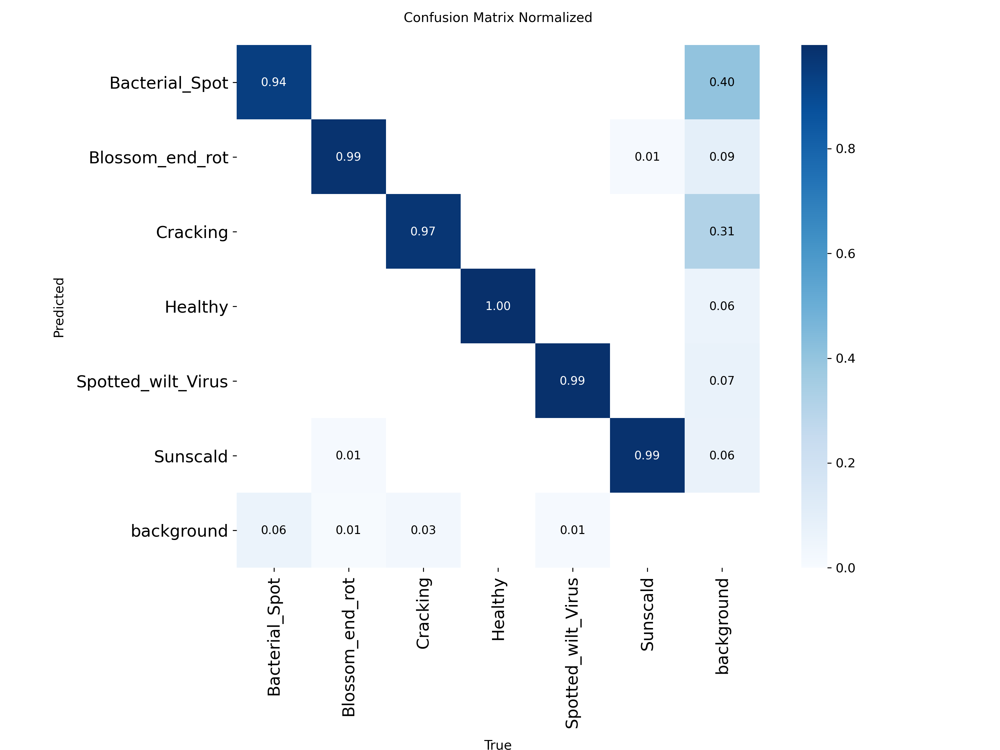


📂 FOLDER: EVAL_TRAIN36_VAL
📸 Menampilkan: confusion_matrix.png


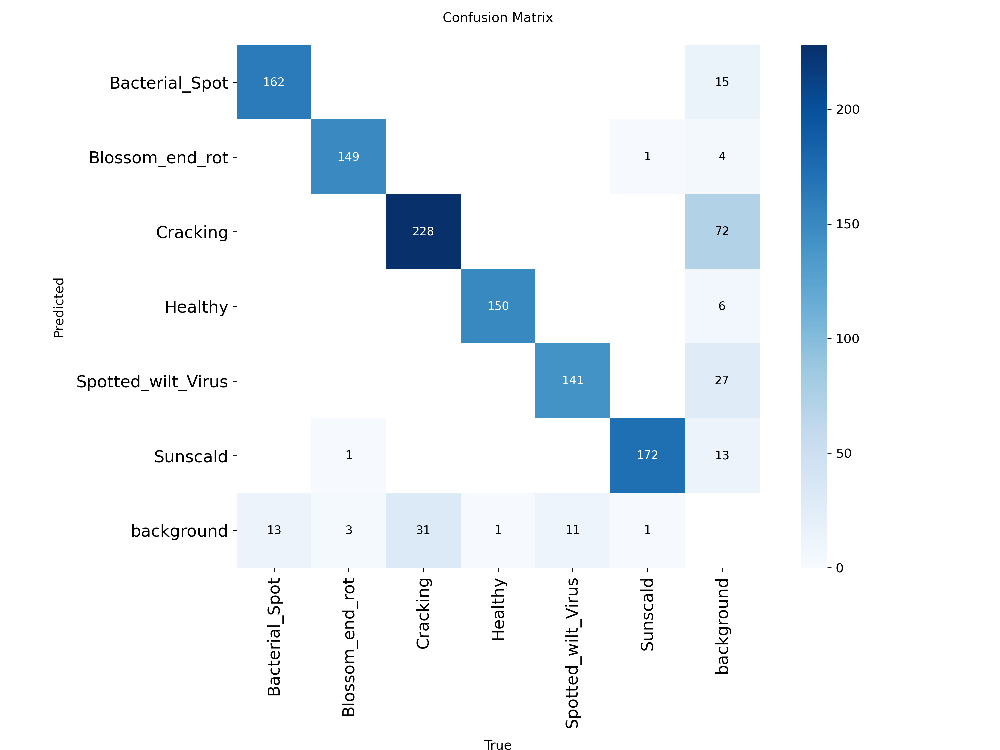

📸 Menampilkan: confusion_matrix_normalized.png


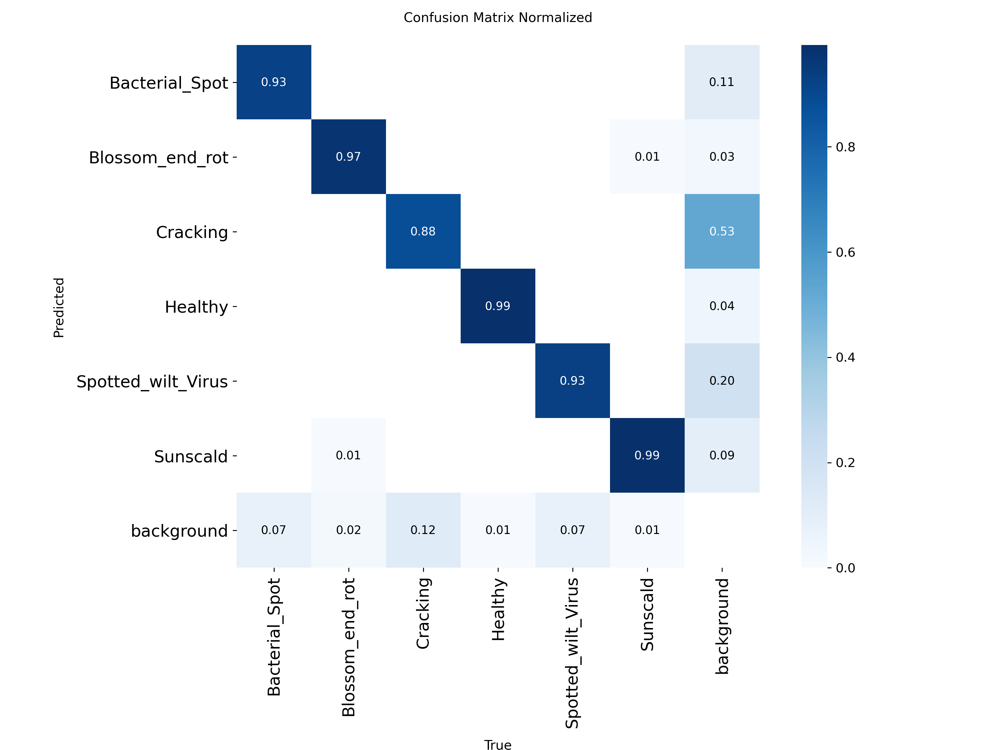


📂 FOLDER: EVAL_TRAIN36_TEST
📸 Menampilkan: confusion_matrix.png


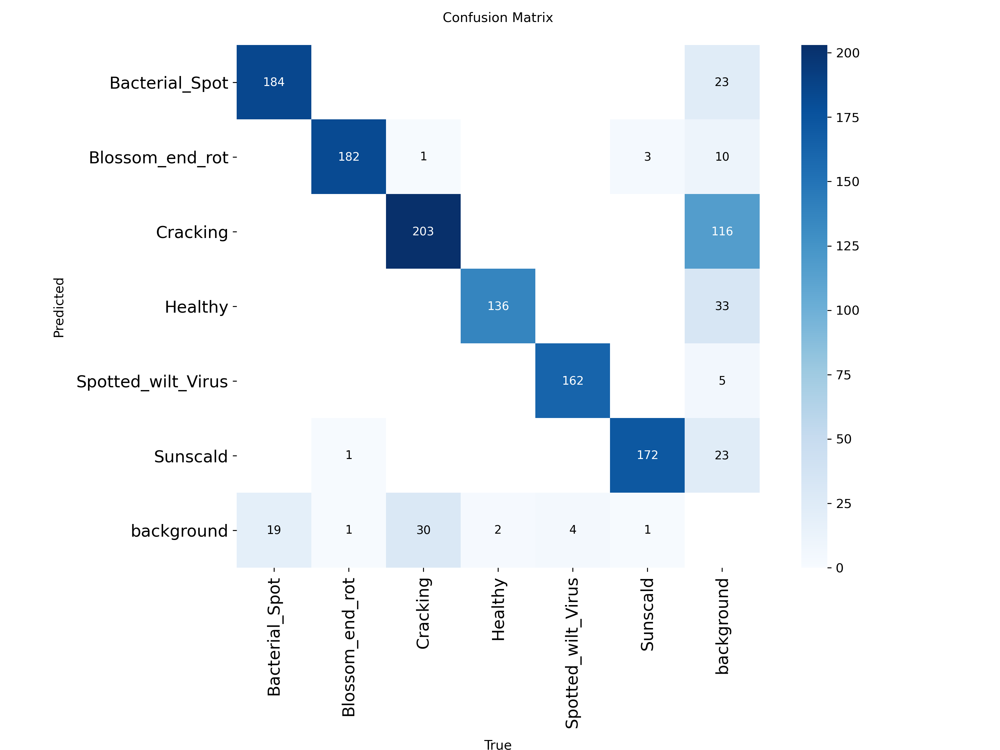

📸 Menampilkan: confusion_matrix_normalized.png


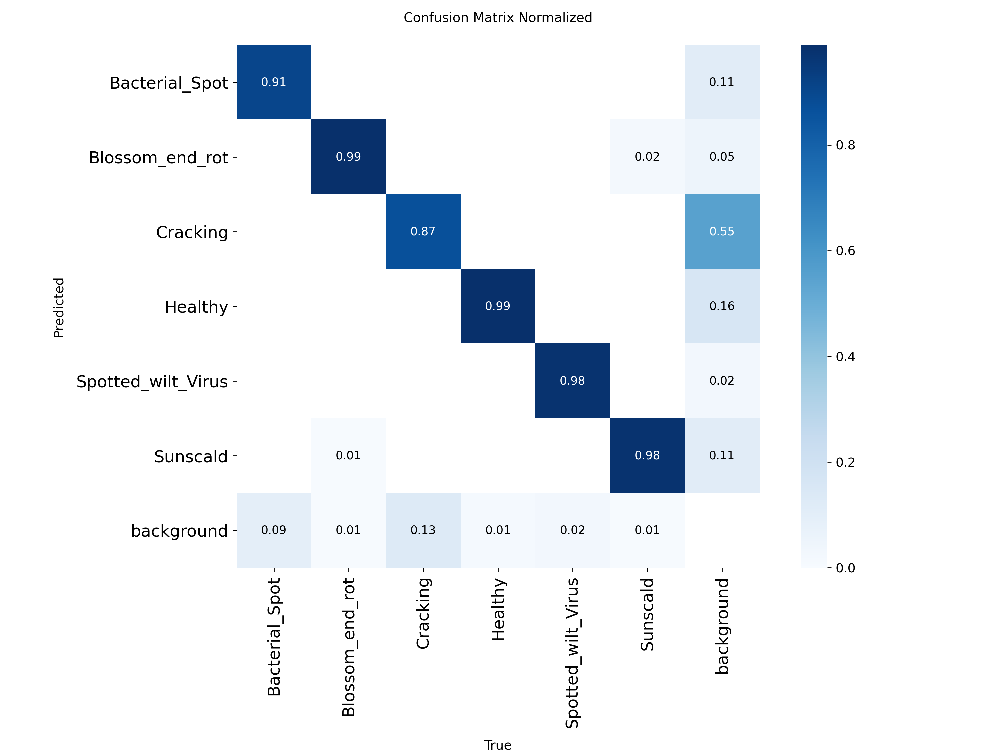


💡 Tips: Kalo di layar tetep nggak muncul, langsung aja buka Windows Explorer lo ke path di atas.


In [2]:
import os
from IPython.display import Image, display

# Alamat folder hasil yang muncul di log lo tadi
base_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\CODE\runs\detect'
folders = ['eval_train36_train', 'eval_train36_val', 'eval_train36_test']
files = ['confusion_matrix.png', 'confusion_matrix_normalized.png']

print("🔍 Mencari dan menampilkan gambar...")

for folder in folders:
    folder_path = os.path.join(base_path, folder)
    print(f"\n📂 FOLDER: {folder.upper()}")
    
    for f in files:
        img_path = os.path.join(folder_path, f)
        if os.path.exists(img_path):
            print(f"📸 Menampilkan: {f}")
            # Pake display + Image ini cara paling 'galak' di Notebook
            display(Image(filename=img_path, width=800))
        else:
            print(f"❌ File {f} nggak ada di {folder_path}")

print("\n💡 Tips: Kalo di layar tetep nggak muncul, langsung aja buka Windows Explorer lo ke path di atas.")

--- Mencari 6 Kelas Berbeda (Ground Truth vs Prediksi) ---
[1] ✅ BERHASIL: Blossom_end_rot
[58] ✅ BERHASIL: Sunscald
[61] ✅ BERHASIL: Healthy
[66] ✅ BERHASIL: Cracking
[244] ✅ BERHASIL: Bacterial_Spot
[362] ✅ BERHASIL: Spotted_wilt_Virus


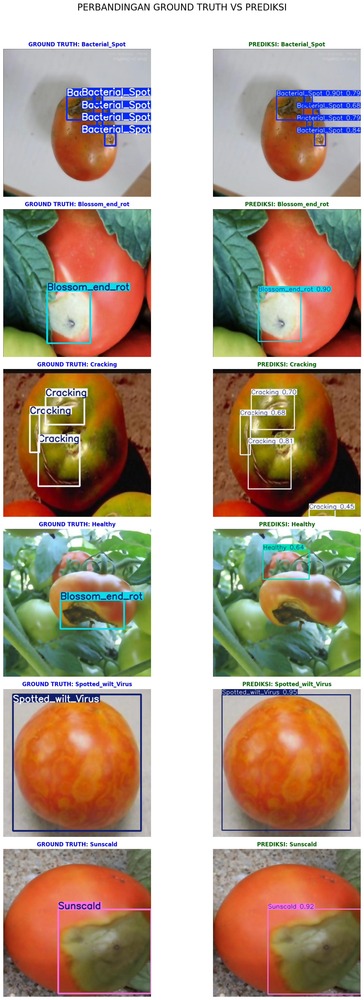

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator, colors
import os
import glob
import cv2

# --- SETTING PATH ---
model_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train36\weights\best.pt'
train_images_path = r'C:\Users\alyss\DATASETRESIZE\datasetresized\dataset_resizendenoising\valid\images'
# Folder label biasanya sejajar dengan folder images, ganti 'images' menjadi 'labels'
label_path = train_images_path.replace('images', 'labels')

model = YOLO(model_path)
image_files = glob.glob(os.path.join(train_images_path, "*.jpg"))
target_classes = model.names

found_samples_pred = {}
found_samples_gt = {}
used_image_paths = set()

print(f"--- Mencari 6 Kelas Berbeda (Ground Truth vs Prediksi) ---")

count = 0
for img_path in image_files:
    count += 1
    if img_path in used_image_paths: continue
        
    results = model.predict(source=img_path, conf=0.2, verbose=False)
    
    for r in results:
        for box in r.boxes:
            class_id = int(box.cls)
            class_name = target_classes[class_id]
            
            if class_name not in found_samples_pred and img_path not in used_image_paths:
                # 1. Simpan Hasil Prediksi
                found_samples_pred[class_name] = r.plot()
                
                # 2. Buat Visualisasi Ground Truth Manual dari file .txt
                img_orig = cv2.imread(img_path)
                h, w, _ = img_orig.shape
                annotator = Annotator(img_orig.copy(), line_width=3, example=str(target_classes))
                
                txt_path = os.path.join(label_path, os.path.basename(img_path).replace('.jpg', '.txt'))
                if os.path.exists(txt_path):
                    with open(txt_path, 'r') as f:
                        for line in f.readlines():
                            cls, x, y, nw, nh = map(float, line.split())
                            # Konversi koordinat YOLO ke Pixel
                            x1 = int((x - nw/2) * w)
                            y1 = int((y - nh/2) * h)
                            x2 = int((x + nw/2) * w)
                            y2 = int((y + nh/2) * h)
                            annotator.box_label([x1, y1, x2, y2], target_classes[int(cls)], color=colors(int(cls), True))
                
                found_samples_gt[class_name] = annotator.result()
                used_image_paths.add(img_path)
                print(f"[{count}] ✅ BERHASIL: {class_name}")
                break

    if len(found_samples_pred) == len(target_classes): break

# --- PROSES MENAMPILKAN ---
if found_samples_pred:
    sorted_keys = sorted(found_samples_pred.keys())
    fig, axes = plt.subplots(len(sorted_keys), 2, figsize=(15, 5 * len(sorted_keys)))

    for i, name in enumerate(sorted_keys):
        # Tampilkan Ground Truth (Kolom Kiri)
        img_gt = found_samples_gt[name][:, :, ::-1]
        axes[i, 0].imshow(img_gt)
        axes[i, 0].set_title(f"GROUND TRUTH: {name}", fontsize=12, fontweight='bold', color='blue')
        axes[i, 0].axis('off')

        # Tampilkan Prediksi (Kolom Kanan)
        img_pred = found_samples_pred[name][:, :, ::-1]
        axes[i, 1].imshow(img_pred)
        axes[i, 1].set_title(f"PREDIKSI: {name}", fontsize=12, fontweight='bold', color='darkgreen')
        axes[i, 1].axis('off')

    plt.suptitle("PERBANDINGAN GROUND TRUTH VS PREDIKSI", fontsize=20, y=1.02)
    plt.tight_layout()
    plt.show()

--- Mencari 6 Kelas Berbeda (Ground Truth vs Prediksi) ---
[1] ✅ BERHASIL: Blossom_end_rot
[4] ✅ BERHASIL: Sunscald
[61] ✅ BERHASIL: Healthy
[66] ✅ BERHASIL: Cracking
[244] ✅ BERHASIL: Bacterial_Spot
[362] ✅ BERHASIL: Spotted_wilt_Virus


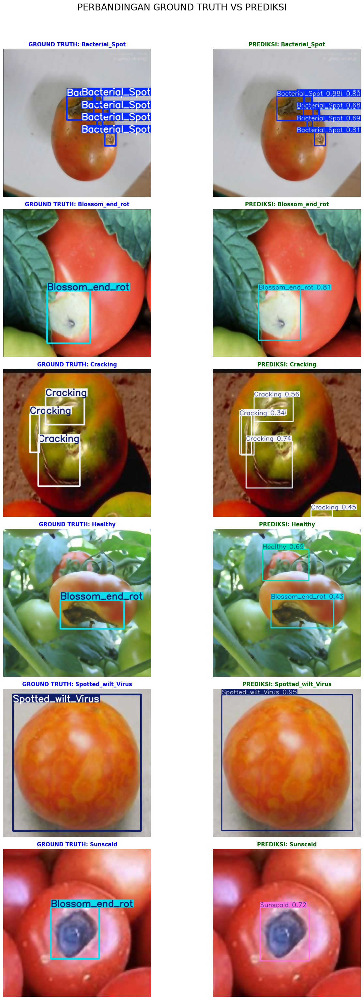

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator, colors
import os
import glob
import cv2

# --- SETTING PATH ---
model_path = r'C:\Users\alyss\CODINGAN TA FIX\CODINGAN TA FIX\CODINGAN YOLO\runs\detect\train38\weights\best.pt'
train_images_path = r'C:\Users\alyss\DATASETRESIZE\datasetresized\dataset_resizendenoising\valid\images'
# Folder label biasanya sejajar dengan folder images, ganti 'images' menjadi 'labels'
label_path = train_images_path.replace('images', 'labels')

model = YOLO(model_path)
image_files = glob.glob(os.path.join(train_images_path, "*.jpg"))
target_classes = model.names

found_samples_pred = {}
found_samples_gt = {}
used_image_paths = set()

print(f"--- Mencari 6 Kelas Berbeda (Ground Truth vs Prediksi) ---")

count = 0
for img_path in image_files:
    count += 1
    if img_path in used_image_paths: continue
        
    results = model.predict(source=img_path, conf=0.2, verbose=False)
    
    for r in results:
        for box in r.boxes:
            class_id = int(box.cls)
            class_name = target_classes[class_id]
            
            if class_name not in found_samples_pred and img_path not in used_image_paths:
                # 1. Simpan Hasil Prediksi
                found_samples_pred[class_name] = r.plot()
                
                # 2. Buat Visualisasi Ground Truth Manual dari file .txt
                img_orig = cv2.imread(img_path)
                h, w, _ = img_orig.shape
                annotator = Annotator(img_orig.copy(), line_width=3, example=str(target_classes))
                
                txt_path = os.path.join(label_path, os.path.basename(img_path).replace('.jpg', '.txt'))
                if os.path.exists(txt_path):
                    with open(txt_path, 'r') as f:
                        for line in f.readlines():
                            cls, x, y, nw, nh = map(float, line.split())
                            # Konversi koordinat YOLO ke Pixel
                            x1 = int((x - nw/2) * w)
                            y1 = int((y - nh/2) * h)
                            x2 = int((x + nw/2) * w)
                            y2 = int((y + nh/2) * h)
                            annotator.box_label([x1, y1, x2, y2], target_classes[int(cls)], color=colors(int(cls), True))
                
                found_samples_gt[class_name] = annotator.result()
                used_image_paths.add(img_path)
                print(f"[{count}] ✅ BERHASIL: {class_name}")
                break

    if len(found_samples_pred) == len(target_classes): break

# --- PROSES MENAMPILKAN ---
if found_samples_pred:
    sorted_keys = sorted(found_samples_pred.keys())
    fig, axes = plt.subplots(len(sorted_keys), 2, figsize=(15, 5 * len(sorted_keys)))

    for i, name in enumerate(sorted_keys):
        # Tampilkan Ground Truth (Kolom Kiri)
        img_gt = found_samples_gt[name][:, :, ::-1]
        axes[i, 0].imshow(img_gt)
        axes[i, 0].set_title(f"GROUND TRUTH: {name}", fontsize=12, fontweight='bold', color='blue')
        axes[i, 0].axis('off')

        # Tampilkan Prediksi (Kolom Kanan)
        img_pred = found_samples_pred[name][:, :, ::-1]
        axes[i, 1].imshow(img_pred)
        axes[i, 1].set_title(f"PREDIKSI: {name}", fontsize=12, fontweight='bold', color='darkgreen')
        axes[i, 1].axis('off')

    plt.suptitle("PERBANDINGAN GROUND TRUTH VS PREDIKSI", fontsize=20, y=1.02)
    plt.tight_layout()
    plt.show()